# Comparison based on climatological means

<div class="alert alert-block alert-success"; background-color:red> This notebook allow the comparison 
    of snow cover fraction derived from cmip6 models, reanalysis, and esa gap-filled data
    based on climatological means over the altitude higher than 1000m.</div> 

## Load required libraries

In [1]:
import numpy as np   
import pandas as pd
import netCDF4 as nc
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import xarray as xr 
import cartopy.crs as ccrs
import cartopy      
import os          
from cartopy.feature import NaturalEarthFeature
import cartopy.crs as ccrs 
import cartopy.feature as cf
from cartopy.util import add_cyclic_point
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

## For parallelisation

In [2]:
from dask.distributed import Client
client = Client(n_workers=16, threads_per_worker=2, memory_limit='32GB')
client

/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36357 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:36357/status,
Dashboard: http://127.0.0.1:36357/status,Workers: 16
Total threads: 32,Total memory: 476.84 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:45881,Workers: 16
Dashboard: http://127.0.0.1:36357/status,Total threads: 32
Started: Just now,Total memory: 476.84 GiB
Comm: tcp://127.0.0.1:42777,Total threads: 2
Dashboard: http://127.0.0.1:43839/status,Memory: 29.80 GiB
Nanny: tcp://127.0.0.1:35965,


## Set variables

In [3]:
"""
We define the thresholds used to filter smal values of snow cover fraction. 
if threshold==0, that means that we consider values higher or equal to 0%. If threshold is
equal to 1, 3, or 5, that means we consider snc (snow cover) strictly higher than threshold.  
"""
threshold = '0'

# Cold months
wet_months_labels = ["JAN","FEB","MAR","APR","NOV","DEC"]
# Dry months 
dry_months_labels = ["MAY","JUN","JUL","AUG","SEP","OCT"]

months_key = ['wet','dry']
months_labels = {'wet':wet_months_labels,'dry':dry_months_labels}

latlim = slice(30,34.5)
lonlim = slice(-10, -2)
period = slice('1982-01-01', '2014-12-31')

# Set input data paths 
path_cmip6_raw_data = '/home/hchaabani/Data/Snow/snc/cmip6/raw_data'
path_cmip6 = '/home/hchaabani/Data/Snow/snc/cmip6/modified_data/monthly/monthly_values_plus_alt/threshold_'+ threshold
path_esa_gf = '/home/hchaabani/Data/Snow/snc/Satellite/ESA_CCI/modified_data/monthly/monthly_values_plus_alt/threshold_'+ threshold
path_era5 = '/home/hchaabani/Data/Snow/snc/Reanalysis/ERA5/modified_data/monthly/monthly_values_plus_alt/threshold_'+ threshold
path_era5_land = '/home/hchaabani/Data/Snow/snc/Reanalysis/ERA-LAND/modified_data/monthly/monthly_values_plus_alt/threshold_'+threshold
path_SIM_35km = '/home/hchaabani/Data/Snow/snc/SIM_35km/Modified_data/monthly/monthly_values_plus_alt/threshold_'+threshold

cmip6_labels = os.listdir(path_cmip6_raw_data)
products_labels = ['esa_gf','era5_land','era5', 
                   'SIM_35km'] + cmip6_labels
# Set output figure directory 
output_path_figures = '/home/hchaabani/Hamid/PHD-mountain-climate/First_Part/Results/figures/maps/v7/means/snc/threshold_'+threshold+'/stations_located'

# Parameter to plot 
par = 'snc_monthly_value_15'

dic_data = {prod:'data' for prod in products_labels}

# Number of days of each month
mon_days = {'wet':[31,28,31,30,30,31],'dry':[31,30,31,31,30,31]}
months = {'wet':[1,2,3,4,11,12],'dry':[5,6,7,8,9,10]}

leg_title = 'snow cover fraction in %'
max_leg = 80
min_leg = 0

# Dictionnaries of products titles 
y_titles = {'esa_gf':'esa_gf-5km','era5_land':'era5_land-10km','era5':'era5-25km',
            'SIM_35km':'lmdz-or-zo-ma-35km-or','BCC-CSM2-HR':'BCC-CSM2-HR',
            'EC-Earth3P-HR':'EC-Earth3P-HR-25km',
            'IPSL-CM6A-ATM-ICO-HR':'IPSL-CM6A-ATM-ICO-HR-50km',
            'IPSL-CM6A-ATM-ICO-VHR':'IPSL-CM6A-ATM-ICO-VHR-25km',
            'IPSL-CM6A-ATM-HR':'IPSL-CM6A-ATM-HR',
            'CNRM-CM6-1-HR':'CNRM-CM6-1-HR-50km'} 

# We define stations labels and coordinates to be pointed on the map
lats = np.array([33.5,32.67,31.53,31.50,31.56,31.20,36])
lons = np.array([-5.16,-4.74,-6.30,-6.45,-6.29,-7.86, -9.8])
names = [" IFR", " MID", "", "TIC,MGN,TIZ", "", " OUK"]

## Importing and preparing data 

In [4]:
dic_data['esa_gf'] = xr.open_dataset(path_esa_gf + '/snc_monthly_esa_gf_plus_alt.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()

for prod in products_labels[4:]:
    dic_data[prod] = xr.open_dataset(path_cmip6 + '/snc_monthly_'+prod+'_plus_alt.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()

latlim = slice(34.5,30)   
dic_data['era5_land'] = xr.open_dataset(path_era5_land + '/snc_monthly_era5_land_plus_alt.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
dic_data['era5'] = xr.open_dataset(path_era5 + '/snc_monthly_era5_plus_alt.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
dic_data['SIM_35km'] = xr.open_dataset(path_SIM_35km + '/snc_monthly_SIM_35km_plus_alt.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()        

In [5]:
cmip6_labels

['EC-Earth3P-HR',
 'IPSL-CM6A-ATM-HR',
 'BCC-CSM2-HR',
 'IPSL-CM6A-ATM-ICO-HR',
 'IPSL-CM6A-ATM-ICO-VHR',
 'CNRM-CM6-1-HR']

In [6]:
np.amax(dic_data['era5']['snc_monthly_value_15'])

<xarray.DataArray 'snc_monthly_value_15' ()>
array(100.)

In [7]:
for prod in products_labels:
    print(prod)
    print("---------------")
    print(dic_data[prod])
    print("=================================================================")

esa_gf
---------------
<xarray.Dataset>
Dimensions:                (lon: 160, lat: 90, time: 396)
Coordinates:
  * lon                    (lon) float64 -9.975 -9.925 -9.875 ... -2.075 -2.025
  * lat                    (lat) float64 30.02 30.07 30.12 ... 34.38 34.42 34.48
  * time                   (time) datetime64[ns] 1982-01-01 ... 2014-12-01
Data variables:
    snc_monthly_value      (time, lat, lon) float64 nan nan nan ... 0.0 0.0 0.0
    days_with_snow         (time, lat, lon) int32 0 0 0 0 0 0 0 ... 0 0 0 0 0 0
    days_without_snow      (time, lat, lon) int32 0 0 0 0 0 0 ... 31 31 31 31 31
    days_with_data         (time, lat, lon) int32 0 0 0 0 0 0 ... 31 31 31 31 31
    days_of_month          (time, lat, lon) int32 31 31 31 31 31 ... 31 31 31 31
    snc_monthly_value_15   (time, lat, lon) float64 nan nan nan ... 0.0 0.0 0.0
    days_with_snow_15      (time, lat, lon) float64 nan nan nan ... 0.0 0.0 0.0
    days_without_snow_15   (time, lat, lon) float64 nan nan nan ... 31.0 3

## The monthly climatological averages

In [8]:
# We define a dictionnary that will contain the five datasets of monthly averages of all above-mentioned variables 
monthly_values_basic_mean = {prod:'a' for prod in products_labels}

In [9]:
# We compute the averages off all variables for all datasets 
for prod in products_labels:   
    monthly_values_basic_mean[prod] = dic_data[prod].groupby('time.month').mean(dim='time')

In [10]:
monthly_values_basic_mean

{'esa_gf': <xarray.Dataset>
 Dimensions:                (lon: 160, lat: 90, month: 12)
 Coordinates:
   * lon                    (lon) float64 -9.975 -9.925 -9.875 ... -2.075 -2.025
   * lat                    (lat) float64 30.02 30.07 30.12 ... 34.38 34.42 34.48
   * month                  (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
 Data variables:
     snc_monthly_value      (month, lat, lon) float64 nan nan ... 0.09778 0.5428
     days_with_snow         (month, lat, lon) float64 0.0 0.0 ... 0.2121 0.4242
     days_without_snow      (month, lat, lon) float64 0.0 0.0 0.0 ... 29.42 28.91
     days_with_data         (month, lat, lon) float64 0.0 0.0 0.0 ... 29.64 29.33
     days_of_month          (month, lat, lon) float64 31.0 31.0 ... 31.0 31.0
     snc_monthly_value_15   (month, lat, lon) float64 nan nan ... 0.09778 0.5428
     days_with_snow_15      (month, lat, lon) float64 nan nan ... 0.2188 0.4375
     days_without_snow_15   (month, lat, lon) float64 nan nan nan ... 30.34 29.81
    

## Plots

<div class="alert alert-block alert-success"; background-color:red> We define the formatting function of the figures </div> 

In [11]:
# This auxiliary function will help us in the formatting of the figures
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

<div class="alert alert-block alert-success"; background-color:red> We personalize the colorbar </div> 

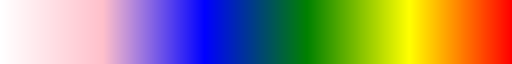

In [12]:
import matplotlib as mpl
def colorFader(c1,c2,mix=0): #fade (linear interpolate) from color c1 (at mix=0) to c2 (mix=1)
    c1=np.array(mpl.colors.to_rgb(c1))
    c2=np.array(mpl.colors.to_rgb(c2))
    return mpl.colors.to_hex((1-mix)*c1 + mix*c2)

c0='white'
c1='pink' 
c2='blue' 
c3='green' 
c4='yellow' 
c5='red' 

n=250

colors0 = []
colors1 = []
colors2 = []
colors3 = []
colors4 = []
for x in range(n+1):
    colors0.append(colorFader(c0,c1,x/n))
    colors1.append(colorFader(c1,c2,x/n))
    colors2.append(colorFader(c2,c3,x/n))
    colors3.append(colorFader(c3,c4,x/n))
    colors4.append(colorFader(c4,c5,x/n))

colors = colors0 + colors1 + colors2 + colors3 + colors4

cmap_init = mpl.colors.ListedColormap(colors)
cmap_init

In [13]:
for ikey_mon, key_mon in enumerate(['wet','dry']):
    # Define the figure and each axis for the 3 rows and 3 columns
    fig, axs = plt.subplots(nrows=10,ncols=6,
                            subplot_kw={'projection': ccrs.PlateCarree()}, dpi=600) #   figsize=(11,8.5)
    # Formatting figure 
    plt.subplots_adjust(wspace=0.08,hspace=0.06)
    set_size(14,22)      
    # Axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array as follow 
    axs=axs.flatten()

    i_ax=0 
    for ipord,prod in enumerate(products_labels):
        for imon,mon in enumerate(months[key_mon]):
            
            # Select the data of month mon and of produc
            data = monthly_values_basic_mean[prod].where(monthly_values_basic_mean[prod]['elevation']>=1000).loc[{'month':mon}][par]
            contour = monthly_values_basic_mean['esa_gf']['elevation'].loc[{'month':1}]
            
            # Plot climatological mean where the altitude is above 1000m. 
            cs = data.plot(ax=axs[i_ax], cmap=cmap_init , add_colorbar=False, vmin=min_leg, 
                           vmax=max_leg, add_labels=False)
            
            # Plot contour 1000m 
            monthly_values_basic_mean['esa_gf']['elevation'].loc[{'month':1}].plot.contour(ax=axs[i_ax],levels=[1000],colors='k',linestyles='-')                                            
            
            # Add features: ocean, its color ...  
            axs[i_ax].add_feature(cf.NaturalEarthFeature('physical', 'ocean', '50m', edgecolor='face',
                                                         facecolor='cyan'))
            # Set domaine extent
            axs[i_ax].set_extent([ -10, -2, 30, 37])
            axs[i_ax].set_title('')
            
            # Pointing the stations on one of the boxplots
            axs[i_ax].scatter(lons, lats, 20, color='black', marker=".", edgecolor='black')
            for j in range(len(names)):
                axs[i_ax].text(lons[j], lats[j], names[j], va="top", family="monospace", weight="bold", 
                                   fontsize=10, color='black')
            
            
            # Draw the coastines for each subplot
            axs[i_ax].coastlines()
                                                                                            
            i_ax=i_ax+1
        
    # Set y labels at products names     
    k=0
    for i_ax in range(0,57,6):
        axs[i_ax].set_ylabel(y_titles[products_labels[k]],  fontsize=10)
        k=k+1
    
    # Set subtitles for each subplot
    for i_ax in range(6):
        axs[i_ax].set_title(months_labels[key_mon][i_ax]+'\n',  fontsize=16)
    
    # Longitude labels
    for i in range(54,60):
        axs[i].set_xticks(np.arange(-10,-2,3), crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter()
        axs[i].xaxis.set_major_formatter(lon_formatter)
        axs[i].set_xlabel('')
        
    # Latitude labels
    for i in range(0,57,6):
        axs[i].set_yticks(np.arange(30,37,2), crs=ccrs.PlateCarree())
        lat_formatter = LatitudeFormatter()
        axs[i].yaxis.set_major_formatter(lat_formatter)
       
    # Add a colorbar axis at the bottom of the graph
    cbar_ax = fig.add_axes([0.15, 0.08, 0.73, 0.01])

    # Draw the colorbar     
    cb = fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init , label=leg_title, ticks=[val for val in range(min_leg,max_leg,3)], orientation='horizontal') 
    cb.set_label(label=leg_title, weight='bold',size='large')
    cb.ax.tick_params(labelsize='large')        
         
    # Title
    #fig.suptitle(suptitles[par]+' '+key_mon+' months', fontsize=26)
        
    # Store figures in png and pdf
    #plt.savefig(output_path_figures+'/'+par+'_'+key_mon+'_months_monthly_averages_threshold_snc_'+threshold+'.pdf')         
    #plt.savefig(output_path_figures+'/'+par+'_'+key_mon+'_months_monthly_averages_threshold_snc_'+threshold+'.png')         

/tmp/ipykernel_24976/4031330536.py:72: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init , label=leg_title, ticks=[val for val in range(min_leg,max_leg,3)], orientation='horizontal')
/tmp/ipykernel_24976/4031330536.py:72: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cb = fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init , label=leg_title, ticks=[val for val in range(min_leg,max_leg,3)], orientation='horizontal')
/home/hchaabani/anaconda3/envs/first_part/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an